Load files

# Review data

In [1]:
import os
import glob
import pandas as pd
from tqdm import tqdm

# Define paths to the folders
hosp_path = "hosp/*.csv.gz"
icu_path = "icu/*.csv.gz"

# Get list of all csv.gz files
hosp_files = glob.glob(hosp_path)
icu_files = glob.glob(icu_path)

# Combine all file paths
all_files = hosp_files + icu_files
for file in all_files:
    print(file)


hosp\admissions.csv.gz
hosp\diagnoses_icd.csv.gz
hosp\drgcodes.csv.gz
hosp\d_hcpcs.csv.gz
hosp\d_icd_diagnoses.csv.gz
hosp\d_icd_procedures.csv.gz
hosp\d_labitems.csv.gz
hosp\emar.csv.gz
hosp\emar_detail.csv.gz
hosp\hcpcsevents.csv.gz
hosp\labevents.csv.gz
hosp\microbiologyevents.csv.gz
hosp\omr.csv.gz
hosp\patients.csv.gz
hosp\pharmacy.csv.gz
hosp\poe.csv.gz
hosp\poe_detail.csv.gz
hosp\prescriptions.csv.gz
hosp\procedures_icd.csv.gz
hosp\provider.csv.gz
hosp\services.csv.gz
hosp\transfers.csv.gz
icu\caregiver.csv.gz
icu\chartevents.csv.gz
icu\datetimeevents.csv.gz
icu\d_items.csv.gz
icu\icustays.csv.gz
icu\ingredientevents.csv.gz
icu\inputevents.csv.gz
icu\outputevents.csv.gz
icu\procedureevents.csv.gz


In [2]:

# Read each file into a dictionary of DataFrames
# dataframes = {}
# for file in tqdm(all_files, desc="Loading MIMIC-IV files"):
#     filename = os.path.basename(file)  # Extract file name
#     dataframes[filename] = pd.read_csv(file, compression="gzip")

# Example: Access a specific file's DataFrame
# df_example = dataframes["example_file.csv.gz"]

# Microbiology Events

In [9]:
file_name = 'hosp\microbiologyevents.csv.gz'
microbiology_df = pd.read_csv(file_name, compression="gzip")
microbiology_df

<>:1: SyntaxWarning: invalid escape sequence '\m'
<>:1: SyntaxWarning: invalid escape sequence '\m'
C:\Users\brian\AppData\Local\Temp\ipykernel_20232\3486077924.py:1: SyntaxWarning: invalid escape sequence '\m'
  file_name = 'hosp\microbiologyevents.csv.gz'
C:\Users\brian\AppData\Local\Temp\ipykernel_20232\3486077924.py:2: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  microbiology_df = pd.read_csv(file_name, compression="gzip")


,microevent_id,subject_id,hadm_id,micro_specimen_id,order_provider_id,chartdate,charttime,spec_itemid,spec_type_desc,test_seq,...,org_name,isolate_num,quantity,ab_itemid,ab_name,dilution_text,dilution_comparison,dilution_value,interpretation,comments
0,1,10000032,NaN,1304715,P69FQC,2180-03-23 00:00:00,2180-03-23 11:51:00,70046,IMMUNOLOGY,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,___
1,2,10000032,NaN,3342526,P69FQC,2180-03-23 00:00:00,2180-03-23 11:51:00,70093,Blood (Toxo),1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NEGATIVE FOR TOXOPLASMA IgG ANTIBODY BY EIA. ...
2,3,10000032,NaN,3910370,P69FQC,2180-03-23 00:00:00,2180-03-23 11:51:00,70017,SEROLOGY/BLOOD,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NONREACTIVE. Reference Range: Non-Reactive.
3,4,10000032,NaN,5401234,P69FQC,2180-03-23 00:00:00,2180-03-23 11:51:00,70017,SEROLOGY/BLOOD,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POSITIVE BY EIA. A positive IgG result genera...
4,5,10000032,NaN,6287540,P69FQC,2180-03-23 00:00:00,2180-03-23 11:51:00,70046,IMMUNOLOGY,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HIV-1 RNA is not detected. Performed using th...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3988219,3988220,19999987,23865745.0,4998105,NaN,2145-11-05 00:00:00,2145-11-05 10:35:00,70012,BLOOD CULTURE,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO GROWTH.
3988220,3988221,19999987,23865745.0,945091,NaN,2145-11-05 00:00:00,2145-11-05 12:15:00,70012,BLOOD CULTURE,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO GROWTH.
3988221,3988222,19999987,23865745.0,1483778,NaN,2145-11-06 00:00:00,2145-11-06 13:15:00,70012,BLOOD CULTURE,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO GROWTH.
3988222,3988223,19999987,23865745.0,9584280,NaN,2145-11-06 00:00:00,2145-11-06 17:05:00,70012,BLOOD CULTURE,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO GROWTH.


In [10]:
# Print all column names
print(microbiology_df.columns.tolist())


['microevent_id', 'subject_id', 'hadm_id', 'micro_specimen_id', 'order_provider_id', 'chartdate', 'charttime', 'spec_itemid', 'spec_type_desc', 'test_seq', 'storedate', 'storetime', 'test_itemid', 'test_name', 'org_itemid', 'org_name', 'isolate_num', 'quantity', 'ab_itemid', 'ab_name', 'dilution_text', 'dilution_comparison', 'dilution_value', 'interpretation', 'comments']


In [11]:
# Count distinct values in key columns
distinct_counts = {
    "distinct_subjects": microbiology_df["subject_id"].nunique(),
    "distinct_hadm_ids": microbiology_df["hadm_id"].nunique()
}

# Print the results
for key, value in distinct_counts.items():
    print(f"{key}: {value}")


distinct_subjects: 222313
distinct_hadm_ids: 201096


In [12]:
# Count null values in key columns
null_counts = {
    "null_subject_ids": microbiology_df["subject_id"].isnull().sum(),
    "null_hadm_ids": microbiology_df["hadm_id"].isnull().sum()
}

# Print the results
for key, value in null_counts.items():
    print(f"{key}: {value}")


null_subject_ids: 0
null_hadm_ids: 2228343


In [13]:
# Count the number of rows where org_name is NULL
null_org_name_count = microbiology_df['org_name'].isna().sum()

# Print the result
print(f"Number of rows where org_name is NULL: {null_org_name_count}")

# These rows represent non-bacterial cultural tests

Number of rows where org_name is NULL: 2352859


In [14]:
# Filter out rows where org_name is NULL
filtered_microbiology_df = microbiology_df[microbiology_df['org_name'].notna()]

# Compute new number of rows
new_row_count = len(filtered_microbiology_df)

# Count distinct subject_id and hadm_id
distinct_subject_count = filtered_microbiology_df['subject_id'].nunique()
distinct_hadm_count = filtered_microbiology_df['hadm_id'].nunique()

# Count null values for subject_id and hadm_id
null_subject_count = filtered_microbiology_df['subject_id'].isna().sum()
null_hadm_count = filtered_microbiology_df['hadm_id'].isna().sum()

# Create a summary dictionary
summary = {
    "New Row Count": new_row_count,
    "Distinct Subject Count": distinct_subject_count,
    "Distinct HADM Count": distinct_hadm_count,
    "Null Subject ID Count": null_subject_count,
    "Null HADM ID Count": null_hadm_count
}

print(summary)

{'New Row Count': 1635365, 'Distinct Subject Count': 100773, 'Distinct HADM Count': 62853, 'Null Subject ID Count': 0, 'Null HADM ID Count': 1004565}


In [15]:
# Group by organism name and calculate required statistics
summary_table = (
    filtered_microbiology_df
    .groupby('org_name')
    .agg(
        row_count=('org_name', 'count'),
        distinct_antibodies=('ab_name', 'nunique'),
        count_S=('interpretation', lambda x: (x == 'S').sum()),
        count_I=('interpretation', lambda x: (x == 'I').sum()),
        count_R=('interpretation', lambda x: (x == 'R').sum()),
        count_null_interpretation=('interpretation', lambda x: x.isna().sum())
    )
    .sort_values(by='row_count', ascending=False)
    .reset_index()
)

summary_table.head(25)

,org_name,row_count,distinct_antibodies,count_S,count_I,count_R,count_null_interpretation
0,ESCHERICHIA COLI,579398,30,467750,16450,91545,3645
1,STAPH AUREUS COAG +,219582,25,160994,359,47243,10980
2,KLEBSIELLA PNEUMONIAE,155688,34,127040,7450,19737,1455
3,PSEUDOMONAS AERUGINOSA,83290,28,65400,5337,10748,1804
4,PROTEUS MIRABILIS,68163,21,58774,1762,6991,636
5,"STAPHYLOCOCCUS, COAGULASE NEGATIVE",58412,25,29423,542,13923,14524
6,ENTEROCOCCUS SP.,53387,12,34320,798,16456,1813
7,CANCELLED,41504,0,0,0,0,41504
8,YEAST,33959,17,18,0,1,33939
9,ENTEROBACTER CLOACAE COMPLEX,25213,25,20726,978,3069,427


In [16]:
# Group by subject_id and hadm_id, counting unique org_names
grouped_counts = filtered_microbiology_df.groupby(['subject_id', 'hadm_id'])['org_name'].nunique()

# Get frequency distribution of unique org_name counts
frequency_counts = grouped_counts.value_counts().sort_index()

# Display frequency distribution
print(frequency_counts)


org_name
1     38207
2     14073
3      5459
4      2606
5      1217
6       631
7       317
8       173
9        81
10       49
11       16
12       12
13        5
14        4
15        3
Name: count, dtype: int64


In [39]:
# Count unique charttime occurrences per (subject_id, hadm_id)
charttime_counts = filtered_microbiology_df.groupby(['subject_id', 'hadm_id'])['charttime'].nunique().reset_index()

# Rename the column for clarity
charttime_counts.rename(columns={'charttime': 'unique_charttime_count'}, inplace=True)
charttime_counts

,subject_id,hadm_id,unique_charttime_count
0,10000826,20032235.0,2
1,10000826,21086876.0,1
2,10001186,21334040.0,2
3,10001186,24906418.0,1
4,10001217,24597018.0,1
5,10001338,22119639.0,1
6,10001401,23705591.0,1
7,10001401,26840593.0,1
8,10001725,25563031.0,1
9,10002013,25442395.0,2


In [40]:
# Count frequency of each unique_charttime_count value
frequency_distribution = charttime_counts['unique_charttime_count'].value_counts().reset_index()
frequency_distribution.columns = ['unique_charttime_count', 'num_subject_hadms']

# Sort by charttime count in ascending order
frequency_distribution.sort_values(by='unique_charttime_count', inplace=True)
frequency_distribution

,unique_charttime_count,num_subject_hadms
0,1,41313
1,2,11093
2,3,4291
3,4,2339
4,5,1250
5,6,757
6,7,500
7,8,350
8,9,241
9,10,171


In [ ]:
# Suggested grab the earliest test for initial results

E.coli - ESCHERICHIA COLI

E.faecalis - ENTEROCOCCUS FAECALIS

K.pneumoniae - KLEBSIELLA PNEUMONIAE

P.aeruginosa - PSEUDOMONAS AERUGINOSA

# E.coli - ESCHERICHIA COLI

## EDA

In [17]:
# Filter for Escherichia coli
ecoli_df = filtered_microbiology_df[filtered_microbiology_df['org_name'] == 'ESCHERICHIA COLI']

# Compute new number of rows
ecoli_row_count = len(ecoli_df)

# Count distinct subject_id and hadm_id
ecoli_distinct_subject_count = ecoli_df['subject_id'].nunique()
ecoli_distinct_hadm_count = ecoli_df['hadm_id'].nunique()

# Create a summary dictionary
ecoli_summary = {
    "Row Count": ecoli_row_count,
    "Distinct Subject Count": ecoli_distinct_subject_count,
    "Distinct HADM Count": ecoli_distinct_hadm_count
}

# Convert to DataFrame and display
pd.DataFrame([ecoli_summary])

,Row Count,Distinct Subject Count,Distinct HADM Count
0,579398,24330,9075


In [48]:
# Group by antibiotic name and calculate required metrics
antibiotic_summary_df = (
    ecoli_df
    .groupby('ab_name')
    .agg(
        row_count=('ab_name', 'count'),
        interpretation_S=('interpretation', lambda x: (x == 'S').sum()),
        interpretation_I=('interpretation', lambda x: (x == 'I').sum()),
        interpretation_R=('interpretation', lambda x: (x == 'R').sum()),
        interpretation_null=('interpretation', lambda x: x.isna().sum()),
    )
    .reset_index()
)

# Calculate the percentage of resistant cases (R) over total row count per antibody
antibiotic_summary_df['percent_resistant'] = (
    (antibiotic_summary_df['interpretation_R'] / antibiotic_summary_df['row_count']) * 100
).round(2)

# Sort by row count in descending order
antibiotic_summary_df.sort_values(by='row_count', ascending=False)


,ab_name,row_count,interpretation_S,interpretation_I,interpretation_R,interpretation_null,percent_resistant
16,GENTAMICIN,44290,39149,107,5034,0,11.37
7,CEFTAZIDIME,44286,40324,793,3169,0,7.16
12,CIPROFLOXACIN,44286,30570,335,13381,0,30.21
20,MEROPENEM,44280,44207,14,59,0,0.13
2,AMPICILLIN/SULBACTAM,44279,26052,8074,10153,0,22.93
28,TOBRAMYCIN,44279,39156,2976,2147,0,4.85
4,CEFAZOLIN,44275,34777,318,9180,0,20.73
10,CEFTRIAXONE,44257,38277,107,5873,0,13.27
29,TRIMETHOPRIM/SULFA,44219,30645,1,13573,0,30.69
5,CEFEPIME,44074,39791,378,3900,0,8.85


In [49]:
# Filter antibiotics with row count greater than 30,000
high_count_ab = antibiotic_summary_df[antibiotic_summary_df['row_count'] > 30000]['ab_name']

# Convert to a list and print
high_count_ab_names_list = high_count_ab.tolist()
print("Antibiotics with row count > 30,000:", high_count_ab_names_list)


Antibiotics with row count > 30,000: ['AMPICILLIN', 'AMPICILLIN/SULBACTAM', 'CEFAZOLIN', 'CEFEPIME', 'CEFTAZIDIME', 'CEFTRIAXONE', 'CIPROFLOXACIN', 'GENTAMICIN', 'MEROPENEM', 'NITROFURANTOIN', 'PIPERACILLIN/TAZO', 'TOBRAMYCIN', 'TRIMETHOPRIM/SULFA']


In [50]:
# Filter out antibiotics with fewer than 30,000 row counts
filtered_ecoli_summary_df = antibiotic_summary_df[antibiotic_summary_df['row_count'] >= 30000].copy()

# Create a dictionary with additional antibiotic details
antibiotic_details = {
    "AMPICILLIN": ["Narrow (Gram-negative & some Gram-positive)", "Frequently resistant due to β-lactamase production", "Occasionally used for UTIs but high resistance"],
    "AMPICILLIN/SULBACTAM": ["Broad (β-lactamase inhibitor improves Gram-negative coverage)", "More effective than ampicillin alone, but resistance is still common", "Sometimes used, but E. coli resistance rates are high"],
    "CEFAZOLIN": ["Narrow (1st-gen cephalosporin, mainly Gram-positive)", "Limited activity, not first-line for E. coli", "Rarely used for E. coli infections"],
    "CEFEPIME": ["Broad (4th-gen cephalosporin, strong Gram-negative)", "Good coverage, including some ESBL-producing strains", "Used for serious E. coli infections, including sepsis"],
    "CEFTAZIDIME": ["Broad (3rd-gen cephalosporin, Gram-negative focus)", "Good activity, including Pseudomonas", "Used for resistant E. coli infections"],
    "CEFTRIAXONE": ["Broad (3rd-gen cephalosporin, strong Gram-negative)", "Very effective, common first-line for serious E. coli infections", "Used frequently for UTIs, sepsis, and intra-abdominal infections"],
    "CIPROFLOXACIN": ["Broad (Fluoroquinolone, strong Gram-negative)", "Effective, but resistance is increasing", "Used for complicated UTIs and bloodstream infections"],
    "GENTAMICIN": ["Broad (Aminoglycoside, strong Gram-negative)", "Good coverage but used in combination therapy", "Used for severe E. coli infections (e.g., sepsis)"],
    "MEROPENEM": ["Broad (Carbapenem, very strong Gram-negative)", "Excellent coverage, even ESBL-producing E. coli", "Used for multi-drug resistant E. coli infections"],
    "NITROFURANTOIN": ["Narrow (Mainly for UTIs, selective Gram-negative)", "Highly effective for E. coli UTIs", "First-line for uncomplicated UTIs"],
    "PIPERACILLIN/TAZO": ["Broad (Anti-pseudomonal penicillin + β-lactamase inhibitor)", "Very effective, covers resistant E. coli", "Used for severe infections (e.g., intra-abdominal, sepsis)"],
    "TOBRAMYCIN": ["Broad (Aminoglycoside, similar to Gentamicin)", "Good coverage, often used when resistance is suspected", "Used for serious infections, often in combination therapy"],
    "TRIMETHOPRIM/SULFA": ["Broad (Sulfonamide, inhibits folate synthesis)", "Effective, but resistance is increasing", "Used for UTIs and some systemic infections"]
}

# Convert the dictionary into a DataFrame
ab_details_df = pd.DataFrame.from_dict(antibiotic_details, orient='index', columns=[
    "Spectrum", "Activity", "Common Usage"
]).reset_index().rename(columns={"index": "ab_name"})

# Merge with the filtered summary DataFrame
filtered_ecoli_summary_df = filtered_ecoli_summary_df.merge(ab_details_df, on="ab_name", how="left")

# Drop unnecessary columns
columns_to_drop = ["interpretation_S", "interpretation_I", "interpretation_R", "interpretation_null"]
final_ecoli_summary_df = filtered_ecoli_summary_df.drop(columns=columns_to_drop, errors="ignore")

# Ensure all text in the DataFrame is fully visible
pd.set_option("display.max_colwidth", None)  # Ensures text columns show full content
pd.set_option("display.max_rows", None)  # Shows all rows if needed
pd.set_option("display.max_columns", None)  # Ensures all columns are displayed

final_ecoli_summary_df

,ab_name,row_count,percent_resistant,Spectrum,Activity,Common Usage
0,AMPICILLIN,44072,51.37,Narrow (Gram-negative & some Gram-positive),Frequently resistant due to β-lactamase production,Occasionally used for UTIs but high resistance
1,AMPICILLIN/SULBACTAM,44279,22.93,Broad (β-lactamase inhibitor improves Gram-negative coverage),"More effective than ampicillin alone, but resistance is still common","Sometimes used, but E. coli resistance rates are high"
2,CEFAZOLIN,44275,20.73,"Narrow (1st-gen cephalosporin, mainly Gram-positive)","Limited activity, not first-line for E. coli",Rarely used for E. coli infections
3,CEFEPIME,44074,8.85,"Broad (4th-gen cephalosporin, strong Gram-negative)","Good coverage, including some ESBL-producing strains","Used for serious E. coli infections, including sepsis"
4,CEFTAZIDIME,44286,7.16,"Broad (3rd-gen cephalosporin, Gram-negative focus)","Good activity, including Pseudomonas",Used for resistant E. coli infections
5,CEFTRIAXONE,44257,13.27,"Broad (3rd-gen cephalosporin, strong Gram-negative)","Very effective, common first-line for serious E. coli infections","Used frequently for UTIs, sepsis, and intra-abdominal infections"
6,CIPROFLOXACIN,44286,30.21,"Broad (Fluoroquinolone, strong Gram-negative)","Effective, but resistance is increasing",Used for complicated UTIs and bloodstream infections
7,GENTAMICIN,44290,11.37,"Broad (Aminoglycoside, strong Gram-negative)",Good coverage but used in combination therapy,"Used for severe E. coli infections (e.g., sepsis)"
8,MEROPENEM,44280,0.13,"Broad (Carbapenem, very strong Gram-negative)","Excellent coverage, even ESBL-producing E. coli",Used for multi-drug resistant E. coli infections
9,NITROFURANTOIN,37128,1.91,"Narrow (Mainly for UTIs, selective Gram-negative)",Highly effective for E. coli UTIs,First-line for uncomplicated UTIs


In [14]:
# Filter ecoli_df for only the selected antibiotics
filtered_ecoli_df = ecoli_df[ecoli_df['ab_name'].isin(high_count_ab_names_list)]

filtered_ecoli_df

## Pickle

In [15]:
# Select unique subject_id and hadm_id pairs for merging with lab events
unique_ecoli_subjects_hadm = filtered_ecoli_df[['subject_id', 'hadm_id']].drop_duplicates()


In [16]:
# Save unique E. coli subject & admission IDs as a pickle file
unique_ecoli_subjects_hadm.to_pickle("unique_ecoli_subjects_hadm.pkl")


In [2]:
# Load data
unique_ecoli_subjects_hadm = pd.read_pickle("unique_ecoli_subjects_hadm.pkl")


## E.faecalis - ENTEROCOCCUS FAECALIS

### EDA

In [51]:
# Filter for Escherichia coli
df = filtered_microbiology_df[filtered_microbiology_df['org_name'] == 'ENTEROCOCCUS FAECALIS']

# Compute new number of rows
row_count = len(df)

# Count distinct subject_id and hadm_id
distinct_subject_count = df['subject_id'].nunique()
distinct_hadm_count = df['hadm_id'].nunique()

# Create a summary dictionary
summary = {
    "Row Count": row_count,
    "Distinct Subject Count": distinct_subject_count,
    "Distinct HADM Count": distinct_hadm_count
}

# Convert to DataFrame and display
pd.DataFrame([summary])

,Row Count,Distinct Subject Count,Distinct HADM Count
0,10146,1803,946


In [52]:
# Group by antibiotic name and calculate required metrics
antibiotic_summary_df = (
    df
    .groupby('ab_name')
    .agg(
        row_count=('ab_name', 'count'),
        interpretation_S=('interpretation', lambda x: (x == 'S').sum()),
        interpretation_I=('interpretation', lambda x: (x == 'I').sum()),
        interpretation_R=('interpretation', lambda x: (x == 'R').sum()),
        interpretation_null=('interpretation', lambda x: x.isna().sum()),
    )
    .reset_index()
)

# Calculate the percentage of resistant cases (R) over total row count per antibody
antibiotic_summary_df['percent_resistant'] = (
    (antibiotic_summary_df['interpretation_R'] / antibiotic_summary_df['row_count']) * 100
).round(2)

# Sort by row count in descending order
antibiotic_summary_df.sort_values(by='row_count', ascending=False)


,ab_name,row_count,interpretation_S,interpretation_I,interpretation_R,interpretation_null,percent_resistant
0,AMPICILLIN,2306,2302,0,4,0,0.17
14,VANCOMYCIN,2300,2083,12,205,0,8.91
10,PENICILLIN G,1313,1303,0,10,0,0.76
12,TETRACYCLINE,1031,219,3,809,0,78.47
8,NITROFURANTOIN,982,975,5,2,0,0.20
2,DAPTOMYCIN,867,855,10,2,0,0.23
7,LINEZOLID,315,313,2,0,0,0.00
6,LEVOFLOXACIN,45,33,0,12,0,26.67
1,CIPROFLOXACIN,21,14,0,7,0,33.33
3,DOXYCYCLINE,9,0,1,8,0,88.89


In [53]:
# Filter antibiotics with row count greater than 300
high_count_ab = antibiotic_summary_df[antibiotic_summary_df['row_count'] > 300]['ab_name']

# Convert to a list and print
high_count_ab_names_list = high_count_ab.tolist()
print("Antibiotics with row count > 300:", high_count_ab_names_list)


Antibiotics with row count > 300: ['AMPICILLIN', 'DAPTOMYCIN', 'LINEZOLID', 'NITROFURANTOIN', 'PENICILLIN G', 'TETRACYCLINE', 'VANCOMYCIN']


In [54]:
# Filter out antibiotics with fewer than 300 row counts
filtered_summary_df = antibiotic_summary_df[antibiotic_summary_df['row_count'] >= 300].copy()

# Create a dictionary with additional antibiotic details
antibiotic_details = {
    "AMPICILLIN": ["Narrow (Gram-positive)", "Highly effective", "First-line for *E. faecalis* infections, including endocarditis and UTIs"],
    "DAPTOMYCIN": ["Broad (Gram-positive)", "Highly effective, even against resistant strains", "Used for bloodstream infections and endocarditis, not for pneumonia"],
    "LINEZOLID": ["Broad (Gram-positive)", "Effective, including some resistant strains", "Used for multi-drug resistant infections, including VRE"],
    "NITROFURANTOIN": ["Narrow (UTI-specific)", "Highly effective", "First-line for uncomplicated *E. faecalis* UTIs"],
    "PENICILLIN G": ["Narrow (Gram-positive)", "Good activity, but less potent than ampicillin", "Used for serious infections when *E. faecalis* is susceptible"],
    "TETRACYCLINE": ["Broad (Gram-positive & Gram-negative)", "Variable, resistance is common", "Rarely used, unless susceptibility is confirmed"],
    "VANCOMYCIN": ["Broad (Gram-positive)", "Highly effective, but VRE (Vancomycin-resistant Enterococcus) exists", "Used for serious infections when susceptible, alternative for penicillin-allergic patients"],
}

# Convert the dictionary into a DataFrame
ab_details_df = pd.DataFrame.from_dict(antibiotic_details, orient='index', columns=[
    "Spectrum", "Activity", "Common Usage"
]).reset_index().rename(columns={"index": "ab_name"})

# Merge with the filtered summary DataFrame
filtered_summary_df = filtered_summary_df.merge(ab_details_df, on="ab_name", how="left")

# Drop unnecessary columns
columns_to_drop = ["interpretation_S", "interpretation_I", "interpretation_R", "interpretation_null"]
final_summary_df = filtered_summary_df.drop(columns=columns_to_drop, errors="ignore")

# Ensure all text in the DataFrame is fully visible
pd.set_option("display.max_colwidth", None)  # Ensures text columns show full content
pd.set_option("display.max_rows", None)  # Shows all rows if needed
pd.set_option("display.max_columns", None)  # Ensures all columns are displayed

final_summary_df

,ab_name,row_count,percent_resistant,Spectrum,Activity,Common Usage
0,AMPICILLIN,2306,0.17,Narrow (Gram-positive),Highly effective,"First-line for *E. faecalis* infections, including endocarditis and UTIs"
1,DAPTOMYCIN,867,0.23,Broad (Gram-positive),"Highly effective, even against resistant strains","Used for bloodstream infections and endocarditis, not for pneumonia"
2,LINEZOLID,315,0.00,Broad (Gram-positive),"Effective, including some resistant strains","Used for multi-drug resistant infections, including VRE"
3,NITROFURANTOIN,982,0.20,Narrow (UTI-specific),Highly effective,First-line for uncomplicated *E. faecalis* UTIs
4,PENICILLIN G,1313,0.76,Narrow (Gram-positive),"Good activity, but less potent than ampicillin",Used for serious infections when *E. faecalis* is susceptible
5,TETRACYCLINE,1031,78.47,Broad (Gram-positive & Gram-negative),"Variable, resistance is common","Rarely used, unless susceptibility is confirmed"
6,VANCOMYCIN,2300,8.91,Broad (Gram-positive),"Highly effective, but VRE (Vancomycin-resistant Enterococcus) exists","Used for serious infections when susceptible, alternative for penicillin-allergic patients"


In [25]:
# Filter df for only the selected antibiotics
filtered_df = df[df['ab_name'].isin(high_count_ab_names_list)]

filtered_df.head(10)

,microevent_id,subject_id,hadm_id,micro_specimen_id,order_provider_id,chartdate,charttime,spec_itemid,spec_type_desc,test_seq,storedate,storetime,test_itemid,test_name,org_itemid,org_name,isolate_num,quantity,ab_itemid,ab_name,dilution_text,dilution_comparison,dilution_value,interpretation,comments
577,578,10001401,23705591.0,3045900,NaN,2134-10-09 00:00:00,2134-10-09 13:45:00,70079,URINE,1,2134-10-12 00:00:00,2134-10-12 11:09:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90004.0,AMPICILLIN,<=2,<=,2.0,S,NaN
578,579,10001401,23705591.0,3045900,NaN,2134-10-09 00:00:00,2134-10-09 13:45:00,70079,URINE,1,2134-10-12 00:00:00,2134-10-12 11:09:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90010.0,NITROFURANTOIN,<=16,<=,16.0,S,NaN
579,580,10001401,23705591.0,3045900,NaN,2134-10-09 00:00:00,2134-10-09 13:45:00,70079,URINE,1,2134-10-12 00:00:00,2134-10-12 11:09:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90011.0,TETRACYCLINE,=>16,=>,16.0,R,NaN
580,581,10001401,23705591.0,3045900,NaN,2134-10-09 00:00:00,2134-10-09 13:45:00,70079,URINE,1,2134-10-12 00:00:00,2134-10-12 11:09:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90015.0,VANCOMYCIN,1,=,1.0,S,NaN
797,798,10001725,NaN,9033729,P87FV4,2118-11-26 00:00:00,2118-11-26 11:05:00,70079,URINE,1,2118-11-28 00:00:00,2118-11-28 14:44:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90004.0,AMPICILLIN,<=2,<=,2.0,S,___
798,799,10001725,NaN,9033729,P87FV4,2118-11-26 00:00:00,2118-11-26 11:05:00,70079,URINE,1,2118-11-28 00:00:00,2118-11-28 14:44:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90010.0,NITROFURANTOIN,<=16,<=,16.0,S,___
799,800,10001725,NaN,9033729,P87FV4,2118-11-26 00:00:00,2118-11-26 11:05:00,70079,URINE,1,2118-11-28 00:00:00,2118-11-28 14:44:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90011.0,TETRACYCLINE,=>16,=>,16.0,R,___
800,801,10001725,NaN,9033729,P87FV4,2118-11-26 00:00:00,2118-11-26 11:05:00,70079,URINE,1,2118-11-28 00:00:00,2118-11-28 14:44:00,90039,URINE CULTURE,80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90015.0,VANCOMYCIN,2,=,2.0,S,___
5349,5350,10012292,NaN,7626355,NaN,2171-07-17 00:00:00,2171-07-17 13:00:00,70012,BLOOD CULTURE,1,2171-07-19 00:00:00,2171-07-19 11:33:00,90201,"Blood Culture, Routine",80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90003.0,PENICILLIN G,4,=,4.0,S,NaN
5350,5351,10012292,NaN,7626355,NaN,2171-07-17 00:00:00,2171-07-17 13:00:00,70012,BLOOD CULTURE,1,2171-07-19 00:00:00,2171-07-19 11:33:00,90201,"Blood Culture, Routine",80172.0,ENTEROCOCCUS FAECALIS,1.0,NaN,90004.0,AMPICILLIN,<=2,<=,2.0,S,NaN


### Pickle

In [23]:
# Select unique subject_id and hadm_id pairs for merging with lab events
unique_subjects_hadm = filtered_df[['subject_id', 'hadm_id']].drop_duplicates()


In [24]:
# Save unique E. coli subject & admission IDs as a pickle file
unique_subjects_hadm.to_pickle("unique_efaecalis_subjects_hadm.pkl")


In [3]:
# Load data
unique_efaecalis_subjects_hadm = pd.read_pickle("unique_efaecalis_subjects_hadm.pkl")

## K.pneumoniae - KLEBSIELLA PNEUMONIAE

### EDA 

In [55]:
# Filter for Escherichia coli
df = filtered_microbiology_df[filtered_microbiology_df['org_name'] == 'KLEBSIELLA PNEUMONIAE']

# Compute new number of rows
row_count = len(df)

# Count distinct subject_id and hadm_id
distinct_subject_count = df['subject_id'].nunique()
distinct_hadm_count = df['hadm_id'].nunique()

# Create a summary dictionary
summary = {
    "Row Count": row_count,
    "Distinct Subject Count": distinct_subject_count,
    "Distinct HADM Count": distinct_hadm_count
}

# Convert to DataFrame and display
pd.DataFrame([summary])

,Row Count,Distinct Subject Count,Distinct HADM Count
0,155688,7679,3699


In [56]:
# Group by antibiotic name and calculate required metrics
antibiotic_summary_df = (
    df
    .groupby('ab_name')
    .agg(
        row_count=('ab_name', 'count'),
        interpretation_S=('interpretation', lambda x: (x == 'S').sum()),
        interpretation_I=('interpretation', lambda x: (x == 'I').sum()),
        interpretation_R=('interpretation', lambda x: (x == 'R').sum()),
        interpretation_null=('interpretation', lambda x: x.isna().sum()),
    )
    .reset_index()
)

# Calculate the percentage of resistant cases (R) over total row count per antibody
antibiotic_summary_df['percent_resistant'] = (
    (antibiotic_summary_df['interpretation_R'] / antibiotic_summary_df['row_count']) * 100
).round(2)

# Sort by row count in descending order
antibiotic_summary_df.sort_values(by='row_count', ascending=False)


,ab_name,row_count,interpretation_S,interpretation_I,interpretation_R,interpretation_null,percent_resistant
19,GENTAMICIN,13020,11842,160,1018,0,7.82
32,TOBRAMYCIN,13013,11424,609,980,0,7.53
23,MEROPENEM,13013,12901,6,106,0,0.81
13,CIPROFLOXACIN,13011,10769,310,1932,0,14.85
8,CEFTAZIDIME,13011,11135,365,1511,0,11.61
2,AMPICILLIN/SULBACTAM,13010,9595,772,2643,0,20.32
11,CEFTRIAXONE,13003,10904,25,2073,0,15.94
4,CEFAZOLIN,13002,10453,43,2506,0,19.27
33,TRIMETHOPRIM/SULFA,12988,10522,3,2463,0,18.96
5,CEFEPIME,12937,11236,77,1622,0,12.54


In [57]:
# Filter antibiotics with row count greater than 3000
high_count_ab = antibiotic_summary_df[antibiotic_summary_df['row_count'] > 3000]['ab_name']

# Convert to a list and print
high_count_ab_names_list = high_count_ab.tolist()
print("Antibiotics with row count > 3000:", high_count_ab_names_list)
print(len(high_count_ab_names_list))


Antibiotics with row count > 3000: ['AMPICILLIN/SULBACTAM', 'CEFAZOLIN', 'CEFEPIME', 'CEFTAZIDIME', 'CEFTRIAXONE', 'CIPROFLOXACIN', 'GENTAMICIN', 'MEROPENEM', 'NITROFURANTOIN', 'PIPERACILLIN/TAZO', 'TOBRAMYCIN', 'TRIMETHOPRIM/SULFA']
12


In [58]:
# Filter out antibiotics with fewer than 3000 row counts
filtered_summary_df = antibiotic_summary_df[antibiotic_summary_df['row_count'] >= 3000].copy()

# Create a dictionary with additional antibiotic details
antibiotic_details = {
    "AMPICILLIN/SULBACTAM": ["Broad (β-lactamase inhibitor improves Gram-negative coverage)", "Limited activity, high resistance due to β-lactamase production", "Rarely used due to resistance"],
    "CEFAZOLIN": ["Narrow (1st-gen cephalosporin, mainly Gram-positive)", "Limited activity, often ineffective", "Not recommended for *K. pneumoniae* infections"],
    "CEFEPIME": ["Broad (4th-gen cephalosporin, strong Gram-negative)", "Good coverage, including some ESBL strains", "Used for serious infections, including pneumonia and sepsis"],
    "CEFTAZIDIME": ["Broad (3rd-gen cephalosporin, Gram-negative focus)", "Good activity, including some multidrug-resistant strains", "Used for resistant infections, including pneumonia"],
    "CEFTRIAXONE": ["Broad (3rd-gen cephalosporin, strong Gram-negative)", "Effective, but resistance is increasing", "Used for pneumonia, UTIs, and bloodstream infections"],
    "CIPROFLOXACIN": ["Broad (Fluoroquinolone, strong Gram-negative)", "Effective, but resistance is increasing", "Used for complicated UTIs and respiratory infections"],
    "GENTAMICIN": ["Broad (Aminoglycoside, strong Gram-negative)", "Good activity, often used in combination therapy", "Used for severe *K. pneumoniae* infections, including sepsis"],
    "MEROPENEM": ["Broad (Carbapenem, very strong Gram-negative)", "Excellent coverage, including ESBL and some carbapenemase-producing strains", "Used for multidrug-resistant *K. pneumoniae* infections"],
    "NITROFURANTOIN": ["Narrow (Mainly for UTIs, selective Gram-negative)", "Limited activity, often ineffective", "Rarely used for *K. pneumoniae* due to resistance"],
    "PIPERACILLIN/TAZO": ["Broad (Anti-pseudomonal penicillin + β-lactamase inhibitor)", "Effective, but resistance is increasing", "Used for serious infections, including pneumonia and sepsis"],
    "TOBRAMYCIN": ["Broad (Aminoglycoside, similar to Gentamicin)", "Good activity, often used when resistance is suspected", "Used for severe infections, often in combination therapy"],
    "TRIMETHOPRIM/SULFA": ["Broad (Sulfonamide, inhibits folate synthesis)", "Variable effectiveness, resistance is common", "Used for UTIs and some systemic infections when susceptible"],
}

# Convert the dictionary into a DataFrame
ab_details_df = pd.DataFrame.from_dict(antibiotic_details, orient='index', columns=[
    "Spectrum", "Activity", "Common Usage"
]).reset_index().rename(columns={"index": "ab_name"})

# Merge with the filtered summary DataFrame
filtered_summary_df = filtered_summary_df.merge(ab_details_df, on="ab_name", how="left")

# Drop unnecessary columns
columns_to_drop = ["interpretation_S", "interpretation_I", "interpretation_R", "interpretation_null"]
final_summary_df = filtered_summary_df.drop(columns=columns_to_drop, errors="ignore")

# Ensure all text in the DataFrame is fully visible
pd.set_option("display.max_colwidth", None)  # Ensures text columns show full content
pd.set_option("display.max_rows", None)  # Shows all rows if needed
pd.set_option("display.max_columns", None)  # Ensures all columns are displayed

final_summary_df

,ab_name,row_count,percent_resistant,Spectrum,Activity,Common Usage
0,AMPICILLIN/SULBACTAM,13010,20.32,Broad (β-lactamase inhibitor improves Gram-negative coverage),"Limited activity, high resistance due to β-lactamase production",Rarely used due to resistance
1,CEFAZOLIN,13002,19.27,"Narrow (1st-gen cephalosporin, mainly Gram-positive)","Limited activity, often ineffective",Not recommended for *K. pneumoniae* infections
2,CEFEPIME,12937,12.54,"Broad (4th-gen cephalosporin, strong Gram-negative)","Good coverage, including some ESBL strains","Used for serious infections, including pneumonia and sepsis"
3,CEFTAZIDIME,13011,11.61,"Broad (3rd-gen cephalosporin, Gram-negative focus)","Good activity, including some multidrug-resistant strains","Used for resistant infections, including pneumonia"
4,CEFTRIAXONE,13003,15.94,"Broad (3rd-gen cephalosporin, strong Gram-negative)","Effective, but resistance is increasing","Used for pneumonia, UTIs, and bloodstream infections"
5,CIPROFLOXACIN,13011,14.85,"Broad (Fluoroquinolone, strong Gram-negative)","Effective, but resistance is increasing",Used for complicated UTIs and respiratory infections
6,GENTAMICIN,13020,7.82,"Broad (Aminoglycoside, strong Gram-negative)","Good activity, often used in combination therapy","Used for severe *K. pneumoniae* infections, including sepsis"
7,MEROPENEM,13013,0.81,"Broad (Carbapenem, very strong Gram-negative)","Excellent coverage, including ESBL and some carbapenemase-producing strains",Used for multidrug-resistant *K. pneumoniae* infections
8,NITROFURANTOIN,9734,20.56,"Narrow (Mainly for UTIs, selective Gram-negative)","Limited activity, often ineffective",Rarely used for *K. pneumoniae* due to resistance
9,PIPERACILLIN/TAZO,11308,3.22,Broad (Anti-pseudomonal penicillin + β-lactamase inhibitor),"Effective, but resistance is increasing","Used for serious infections, including pneumonia and sepsis"


In [33]:
# Filter df for only the selected antibiotics
filtered_df = df[df['ab_name'].isin(high_count_ab_names_list)]

filtered_df.head(10)

,microevent_id,subject_id,hadm_id,micro_specimen_id,order_provider_id,chartdate,charttime,spec_itemid,spec_type_desc,test_seq,storedate,storetime,test_itemid,test_name,org_itemid,org_name,isolate_num,quantity,ab_itemid,ab_name,dilution_text,dilution_comparison,dilution_value,interpretation,comments
599,600,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90005.0,CEFAZOLIN,<=4,<=,4.00,S,NaN
600,601,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90008.0,TRIMETHOPRIM/SULFA,=>16,=>,16.00,R,NaN
601,602,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90010.0,NITROFURANTOIN,<=16,<=,16.00,S,NaN
602,603,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90012.0,GENTAMICIN,<=1,<=,1.00,S,NaN
603,604,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90013.0,TOBRAMYCIN,<=1,<=,1.00,S,NaN
604,605,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90017.0,CEFTAZIDIME,<=1,<=,1.00,S,NaN
605,606,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90018.0,CEFTRIAXONE,<=1,<=,1.00,S,NaN
606,607,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90019.0,CIPROFLOXACIN,<=0.25,<=,0.25,S,NaN
607,608,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90022.0,AMPICILLIN/SULBACTAM,4,=,4.00,S,NaN
608,609,10001401,NaN,3100346,P64FPX,2135-09-20 00:00:00,2135-09-20 13:04:00,70079,URINE,1,2135-09-24 00:00:00,2135-09-24 12:06:00,90039,URINE CULTURE,80004.0,KLEBSIELLA PNEUMONIAE,1.0,NaN,90026.0,PIPERACILLIN/TAZO,<=4,<=,4.00,S,NaN


### Pickle

In [34]:
# Select unique subject_id and hadm_id pairs for merging with lab events
unique_subjects_hadm = filtered_df[['subject_id', 'hadm_id']].drop_duplicates()


In [35]:
# Save unique E. coli subject & admission IDs as a pickle file
unique_subjects_hadm.to_pickle("unique_kpneumoniae_subjects_hadm.pkl")


## P.aeruginosa - PSEUDOMONAS AERUGINOSA

### EDA

In [59]:
# Filter for Escherichia coli
df = filtered_microbiology_df[filtered_microbiology_df['org_name'] == 'PSEUDOMONAS AERUGINOSA']

# Compute new number of rows
row_count = len(df)

# Count distinct subject_id and hadm_id
distinct_subject_count = df['subject_id'].nunique()
distinct_hadm_count = df['hadm_id'].nunique()

# Create a summary dictionary
summary = {
    "Row Count": row_count,
    "Distinct Subject Count": distinct_subject_count,
    "Distinct HADM Count": distinct_hadm_count
}

# Convert to DataFrame and display
pd.DataFrame([summary])

,Row Count,Distinct Subject Count,Distinct HADM Count
0,83290,5238,4261


In [60]:
# Group by antibiotic name and calculate required metrics
antibiotic_summary_df = (
    df
    .groupby('ab_name')
    .agg(
        row_count=('ab_name', 'count'),
        interpretation_S=('interpretation', lambda x: (x == 'S').sum()),
        interpretation_I=('interpretation', lambda x: (x == 'I').sum()),
        interpretation_R=('interpretation', lambda x: (x == 'R').sum()),
        interpretation_null=('interpretation', lambda x: x.isna().sum()),
    )
    .reset_index()
)

# Calculate the percentage of resistant cases (R) over total row count per antibody
antibiotic_summary_df['percent_resistant'] = (
    (antibiotic_summary_df['interpretation_R'] / antibiotic_summary_df['row_count']) * 100
).round(2)

# Sort by row count in descending order
antibiotic_summary_df.sort_values(by='row_count', ascending=False)


,ab_name,row_count,interpretation_S,interpretation_I,interpretation_R,interpretation_null,percent_resistant
11,CIPROFLOXACIN,11198,7540,741,2917,0,26.05
7,CEFTAZIDIME,11196,9024,950,1222,0,10.91
26,TOBRAMYCIN,11195,10054,174,967,0,8.64
16,GENTAMICIN,11190,9192,781,1217,0,10.88
5,CEFEPIME,11185,9108,1167,910,0,8.14
20,MEROPENEM,11183,8649,827,1706,0,15.26
23,PIPERACILLIN/TAZO,11105,9215,579,1311,0,11.81
22,PIPERACILLIN,1576,1265,3,308,0,19.54
0,AMIKACIN,1190,1025,79,86,0,7.23
17,IMIPENEM,234,174,19,41,0,17.52


In [61]:
# Filter antibiotics with row count greater than 3000
high_count_ab = antibiotic_summary_df[antibiotic_summary_df['row_count'] > 3000]['ab_name']

# Convert to a list and print
high_count_ab_names_list = high_count_ab.tolist()
print("Antibiotics with row count > 3000:", high_count_ab_names_list)
print(len(high_count_ab_names_list))


Antibiotics with row count > 3000: ['CEFEPIME', 'CEFTAZIDIME', 'CIPROFLOXACIN', 'GENTAMICIN', 'MEROPENEM', 'PIPERACILLIN/TAZO', 'TOBRAMYCIN']
7


In [62]:
# Filter out antibiotics with fewer than 3000 row counts
filtered_summary_df = antibiotic_summary_df[antibiotic_summary_df['row_count'] >= 3000].copy()

# Create a dictionary with additional antibiotic details
antibiotic_details = {
    "CEFEPIME": ["Broad (4th-gen cephalosporin, strong Gram-negative)", "Good activity, including some multidrug-resistant strains", "Used for serious *P. aeruginosa* infections, including pneumonia and sepsis"],
    "CEFTAZIDIME": ["Broad (3rd-gen cephalosporin, Gram-negative focus)", "Good activity, including *P. aeruginosa*", "Used for resistant infections, including pneumonia"],
    "CIPROFLOXACIN": ["Broad (Fluoroquinolone, strong Gram-negative)", "Effective, but resistance is increasing", "Used for complicated UTIs, pneumonia, and bloodstream infections"],
    "GENTAMICIN": ["Broad (Aminoglycoside, strong Gram-negative)", "Good activity, often used in combination therapy", "Used for severe *P. aeruginosa* infections, including sepsis"],
    "MEROPENEM": ["Broad (Carbapenem, very strong Gram-negative)", "Excellent coverage, including some carbapenemase-producing strains", "Used for multidrug-resistant *P. aeruginosa* infections"],
    "PIPERACILLIN/TAZO": ["Broad (Anti-pseudomonal penicillin + β-lactamase inhibitor)", "Very effective, but resistance is increasing", "Used for serious infections, including pneumonia and sepsis"],
    "TOBRAMYCIN": ["Broad (Aminoglycoside, similar to Gentamicin)", "Good activity, often used when resistance is suspected", "Used for severe infections, often in combination therapy"],
}


# Convert the dictionary into a DataFrame
ab_details_df = pd.DataFrame.from_dict(antibiotic_details, orient='index', columns=[
    "Spectrum", "Activity", "Common Usage"
]).reset_index().rename(columns={"index": "ab_name"})

# Merge with the filtered summary DataFrame
filtered_summary_df = filtered_summary_df.merge(ab_details_df, on="ab_name", how="left")

# Drop unnecessary columns
columns_to_drop = ["interpretation_S", "interpretation_I", "interpretation_R", "interpretation_null"]
final_summary_df = filtered_summary_df.drop(columns=columns_to_drop, errors="ignore")

# Ensure all text in the DataFrame is fully visible
pd.set_option("display.max_colwidth", None)  # Ensures text columns show full content
pd.set_option("display.max_rows", None)  # Shows all rows if needed
pd.set_option("display.max_columns", None)  # Ensures all columns are displayed

final_summary_df

,ab_name,row_count,percent_resistant,Spectrum,Activity,Common Usage
0,CEFEPIME,11185,8.14,"Broad (4th-gen cephalosporin, strong Gram-negative)","Good activity, including some multidrug-resistant strains","Used for serious *P. aeruginosa* infections, including pneumonia and sepsis"
1,CEFTAZIDIME,11196,10.91,"Broad (3rd-gen cephalosporin, Gram-negative focus)","Good activity, including *P. aeruginosa*","Used for resistant infections, including pneumonia"
2,CIPROFLOXACIN,11198,26.05,"Broad (Fluoroquinolone, strong Gram-negative)","Effective, but resistance is increasing","Used for complicated UTIs, pneumonia, and bloodstream infections"
3,GENTAMICIN,11190,10.88,"Broad (Aminoglycoside, strong Gram-negative)","Good activity, often used in combination therapy","Used for severe *P. aeruginosa* infections, including sepsis"
4,MEROPENEM,11183,15.26,"Broad (Carbapenem, very strong Gram-negative)","Excellent coverage, including some carbapenemase-producing strains",Used for multidrug-resistant *P. aeruginosa* infections
5,PIPERACILLIN/TAZO,11105,11.81,Broad (Anti-pseudomonal penicillin + β-lactamase inhibitor),"Very effective, but resistance is increasing","Used for serious infections, including pneumonia and sepsis"
6,TOBRAMYCIN,11195,8.64,"Broad (Aminoglycoside, similar to Gentamicin)","Good activity, often used when resistance is suspected","Used for severe infections, often in combination therapy"


In [44]:
# Filter df for only the selected antibiotics
filtered_df = df[df['ab_name'].isin(high_count_ab_names_list)]

filtered_df.head(10)

,microevent_id,subject_id,hadm_id,micro_specimen_id,order_provider_id,chartdate,charttime,spec_itemid,spec_type_desc,test_seq,storedate,storetime,test_itemid,test_name,org_itemid,org_name,isolate_num,quantity,ab_itemid,ab_name,dilution_text,dilution_comparison,dilution_value,interpretation,comments
549,550,10001401,NaN,9235690,P64FPX,2133-12-15 00:00:00,2133-12-15 11:04:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:46:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90012.0,GENTAMICIN,<=1,<=,1.00,S,NaN
550,551,10001401,NaN,9235690,P64FPX,2133-12-15 00:00:00,2133-12-15 11:04:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:46:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90013.0,TOBRAMYCIN,<=1,<=,1.00,S,NaN
551,552,10001401,NaN,9235690,P64FPX,2133-12-15 00:00:00,2133-12-15 11:04:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:46:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90017.0,CEFTAZIDIME,4,=,4.00,S,NaN
552,553,10001401,NaN,9235690,P64FPX,2133-12-15 00:00:00,2133-12-15 11:04:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:46:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90019.0,CIPROFLOXACIN,<=0.25,<=,0.25,S,NaN
553,554,10001401,NaN,9235690,P64FPX,2133-12-15 00:00:00,2133-12-15 11:04:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:46:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90026.0,PIPERACILLIN/TAZO,8,=,8.00,S,NaN
554,555,10001401,NaN,9235690,P64FPX,2133-12-15 00:00:00,2133-12-15 11:04:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:46:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90028.0,CEFEPIME,2,=,2.00,S,NaN
555,556,10001401,NaN,9235690,P64FPX,2133-12-15 00:00:00,2133-12-15 11:04:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:46:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90029.0,MEROPENEM,<=0.25,<=,0.25,S,NaN
560,561,10001401,NaN,6177474,P64FPX,2133-12-15 00:00:00,2133-12-15 11:09:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:47:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90012.0,GENTAMICIN,<=1,<=,1.00,S,NaN
561,562,10001401,NaN,6177474,P64FPX,2133-12-15 00:00:00,2133-12-15 11:09:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:47:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90013.0,TOBRAMYCIN,<=1,<=,1.00,S,NaN
562,563,10001401,NaN,6177474,P64FPX,2133-12-15 00:00:00,2133-12-15 11:09:00,70079,URINE,1,2133-12-21 00:00:00,2133-12-21 10:47:00,90039,URINE CULTURE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,90017.0,CEFTAZIDIME,4,=,4.00,S,NaN


### Pickle

In [45]:
# Select unique subject_id and hadm_id pairs for merging with lab events
unique_subjects_hadm = filtered_df[['subject_id', 'hadm_id']].drop_duplicates()


In [46]:
# Save unique E. coli subject & admission IDs as a pickle file
unique_subjects_hadm.to_pickle("unique_paeruginosa_subjects_hadm.pkl")


# Load Driver Files

In [2]:
# Load data
unique_ecoli_subjects_hadm = pd.read_pickle("unique_ecoli_subjects_hadm.pkl")
unique_efaecalis_subjects_hadm = pd.read_pickle("unique_efaecalis_subjects_hadm.pkl")
unique_kpneumoniae_subjects_hadm = pd.read_pickle("unique_kpneumoniae_subjects_hadm.pkl")
unique_paeruginosa_subjects_hadm = pd.read_pickle("unique_paeruginosa_subjects_hadm.pkl")

In [3]:
print(unique_ecoli_subjects_hadm.shape[0])
print(unique_efaecalis_subjects_hadm.shape[0])
print(unique_kpneumoniae_subjects_hadm.shape[0])
print(unique_paeruginosa_subjects_hadm.shape[0])

27468
1937
8642
6696


In [4]:
# Sampling (optional)
ecoli_sample = unique_ecoli_subjects_hadm.sample(n=1000, random_state=42)
efaecalis_sample = unique_efaecalis_subjects_hadm.sample(n=1000, random_state=42)
kpneumoniae_sample = unique_kpneumoniae_subjects_hadm.sample(n=1000, random_state=42)
paeruginosa_sample = unique_paeruginosa_subjects_hadm.sample(n=1000, random_state=42)

# Combine samples
combined_sample = pd.concat([ecoli_sample, efaecalis_sample, kpneumoniae_sample, paeruginosa_sample], ignore_index=True)


# Lab Events

In [5]:
file_name = 'hosp\labevents.csv.gz'
labevents_df = pd.read_csv(file_name, compression="gzip")
labevents_df

<>:1: SyntaxWarning: invalid escape sequence '\l'
<>:1: SyntaxWarning: invalid escape sequence '\l'
C:\Users\brian\AppData\Local\Temp\ipykernel_20232\767916435.py:1: SyntaxWarning: invalid escape sequence '\l'
  file_name = 'hosp\labevents.csv.gz'


,labevent_id,subject_id,hadm_id,specimen_id,itemid,order_provider_id,charttime,storetime,value,valuenum,valueuom,ref_range_lower,ref_range_upper,flag,priority,comments
0,1,10000032,NaN,2704548,50931,P69FQC,2180-03-23 11:51:00,2180-03-23 15:56:00,___,95.00,mg/dL,70.0,100.0,NaN,ROUTINE,"IF FASTING, 70-100 NORMAL, >125 PROVISIONAL DI..."
1,2,10000032,NaN,36092842,51071,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,NaN
2,3,10000032,NaN,36092842,51074,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,NaN
3,4,10000032,NaN,36092842,51075,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,BENZODIAZEPINE IMMUNOASSAY SCREEN DOES NOT DET...
4,5,10000032,NaN,36092842,51079,P69FQC,2180-03-23 11:51:00,2180-03-23 16:00:00,NEG,NaN,NaN,NaN,NaN,NaN,ROUTINE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158374759,159057534,19999987,23865745.0,59879875,51279,NaN,2145-11-09 05:30:00,2145-11-09 07:06:00,3.52,3.52,m/uL,4.2,5.4,abnormal,ROUTINE,NaN
158374760,159057535,19999987,23865745.0,59879875,51301,NaN,2145-11-09 05:30:00,2145-11-09 07:06:00,5.7,5.70,K/uL,4.0,11.0,NaN,ROUTINE,NaN
158374761,159057536,19999987,NaN,74914384,50912,P95A45,2146-02-07 11:13:00,2146-02-07 16:26:00,1.1,1.10,mg/dL,0.4,1.1,NaN,ROUTINE,NaN
158374762,159057537,19999987,NaN,74914384,50920,P95A45,2146-02-07 11:13:00,2146-02-07 16:26:00,NaN,NaN,NaN,NaN,NaN,NaN,ROUTINE,"Using this patient's age, gender, and serum cr..."


In [6]:
file_name = 'hosp\d_labitems.csv.gz'
labitems_description = pd.read_csv(file_name, compression="gzip")
labitems_description


<>:1: SyntaxWarning: invalid escape sequence '\d'
<>:1: SyntaxWarning: invalid escape sequence '\d'
C:\Users\brian\AppData\Local\Temp\ipykernel_20232\2048885802.py:1: SyntaxWarning: invalid escape sequence '\d'
  file_name = 'hosp\d_labitems.csv.gz'


,itemid,label,fluid,category
0,50801,Alveolar-arterial Gradient,Blood,Blood Gas
1,50802,Base Excess,Blood,Blood Gas
2,50803,"Calculated Bicarbonate, Whole Blood",Blood,Blood Gas
3,50804,Calculated Total CO2,Blood,Blood Gas
4,50805,Carboxyhemoglobin,Blood,Blood Gas
...,...,...,...,...
1645,53186,MCH,Blood,Chemistry
1646,53187,PAN,Stool,Chemistry
1647,53188,Lymphocytes,Blood,Chemistry
1648,53189,Platelet Count,Blood,Chemistry


In [7]:
# Merge labevents with unique E. coli subjects and admissions
# Set index for faster lookups
labevents_df = labevents_df.set_index(['subject_id', 'hadm_id'])

In [8]:
# Filter only valid (subject_id, hadm_id) pairs
labevents_df = labevents_df.loc[
    labevents_df.index.intersection(combined_sample.set_index(['subject_id', 'hadm_id']).index)
].reset_index()

In [18]:
labevents_df

,subject_id,hadm_id,labevent_id,specimen_id,itemid,order_provider_id,charttime,storetime,value,valuenum,valueuom,ref_range_lower,ref_range_upper,flag,priority,comments
0,10002013,NaN,21341,7052765,50931,P475AS,2155-07-27 13:26:00,2155-07-27 19:57:00,349,349.0,mg/dL,70.0,105.0,abnormal,ROUTINE,NaN
1,10002013,NaN,21342,8423693,50861,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,16,16.0,IU/L,0.0,40.0,NaN,ROUTINE,NaN
2,10002013,NaN,21343,8423693,50868,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,17,17.0,mEq/L,8.0,20.0,NaN,ROUTINE,NaN
3,10002013,NaN,21344,8423693,50878,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,15,15.0,IU/L,0.0,40.0,NaN,ROUTINE,NaN
4,10002013,NaN,21345,8423693,50882,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,26,26.0,mEq/L,22.0,32.0,NaN,ROUTINE,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3472683,19999442,26785317.0,159044323,47571076,50960,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,1.9,1.9,mg/dL,1.6,2.6,NaN,STAT,NaN
3472684,19999442,26785317.0,159044324,47571076,50970,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,3.2,3.2,mg/dL,2.7,4.5,NaN,STAT,NaN
3472685,19999442,26785317.0,159044325,47571076,50971,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,4.1,4.1,mEq/L,3.3,5.1,NaN,STAT,NaN
3472686,19999442,26785317.0,159044326,47571076,50983,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,138,138.0,mEq/L,133.0,145.0,NaN,STAT,NaN


In [19]:
# Merge LABEVENTS with D_LABITEMS on the 'itemid' column to add labels, fluid, category, and loinc_code
# keep the same name to reduce memory usage
labevents_df = labevents_df.merge(
    labitems_description,
    on='itemid',
    how='left'
)
labevents_df

,subject_id,hadm_id,labevent_id,specimen_id,itemid,order_provider_id,charttime,storetime,value,valuenum,valueuom,ref_range_lower,ref_range_upper,flag,priority,comments,label,fluid,category
0,10002013,NaN,21341,7052765,50931,P475AS,2155-07-27 13:26:00,2155-07-27 19:57:00,349,349.0,mg/dL,70.0,105.0,abnormal,ROUTINE,NaN,Glucose,Blood,Chemistry
1,10002013,NaN,21342,8423693,50861,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,16,16.0,IU/L,0.0,40.0,NaN,ROUTINE,NaN,Alanine Aminotransferase (ALT),Blood,Chemistry
2,10002013,NaN,21343,8423693,50868,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,17,17.0,mEq/L,8.0,20.0,NaN,ROUTINE,NaN,Anion Gap,Blood,Chemistry
3,10002013,NaN,21344,8423693,50878,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,15,15.0,IU/L,0.0,40.0,NaN,ROUTINE,NaN,Asparate Aminotransferase (AST),Blood,Chemistry
4,10002013,NaN,21345,8423693,50882,P475AS,2155-07-27 13:26:00,2155-07-27 20:00:00,26,26.0,mEq/L,22.0,32.0,NaN,ROUTINE,NaN,Bicarbonate,Blood,Chemistry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3472683,19999442,26785317.0,159044323,47571076,50960,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,1.9,1.9,mg/dL,1.6,2.6,NaN,STAT,NaN,Magnesium,Blood,Chemistry
3472684,19999442,26785317.0,159044324,47571076,50970,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,3.2,3.2,mg/dL,2.7,4.5,NaN,STAT,NaN,Phosphate,Blood,Chemistry
3472685,19999442,26785317.0,159044325,47571076,50971,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,4.1,4.1,mEq/L,3.3,5.1,NaN,STAT,NaN,Potassium,Blood,Chemistry
3472686,19999442,26785317.0,159044326,47571076,50983,NaN,2148-12-02 05:40:00,2148-12-02 06:57:00,138,138.0,mEq/L,133.0,145.0,NaN,STAT,NaN,Sodium,Blood,Chemistry


In [20]:
# Save as a pickle file
# labevents_df.to_pickle("sample_labevents.pkl")
labevents_df = pd.read_pickle("sample_labevents.pkl")


In [21]:
grouped_counts = labevents_df.groupby('fluid').size().reset_index(name='count')
grouped_counts.sort_values(by='count', ascending=False, inplace=True)
grouped_counts


,fluid,count
1,Blood,2996776
8,Urine,456487
5,Other Body Fluid,8716
0,Ascites,2902
6,Pleural,2837
3,Cerebrospinal Fluid,2044
4,Joint Fluid,1262
7,Stool,1154
2,Bone Marrow,510


In [34]:
grouped_counts = labevents_df.groupby(['label', 'fluid','category']).size().reset_index(name='count')
grouped_counts.sort_values(by='count', ascending=False, inplace=True)
grouped_counts.head(10)


,label,fluid,category,count
264,Creatinine,Blood,Chemistry,88755
400,Hematocrit,Blood,Hematology,87709
773,Urea Nitrogen,Blood,Chemistry,86553
612,Platelet Count,Blood,Hematology,86317
408,Hemoglobin,Blood,Hematology,85685
818,White Blood Cells,Blood,Hematology,85201
507,MCHC,Blood,Hematology,85104
506,MCH,Blood,Hematology,85101
508,MCV,Blood,Hematology,85101
666,Red Blood Cells,Blood,Hematology,85101


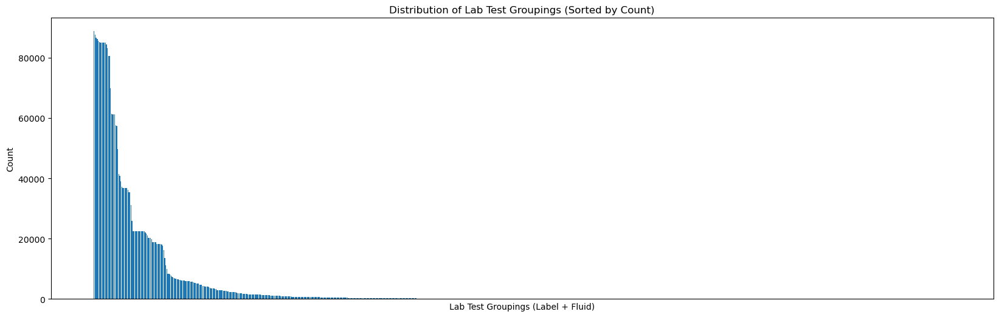

In [23]:
import matplotlib.pyplot as plt
# Plotting the histogram
plt.figure(figsize=(20, 6))
plt.bar(range(len(grouped_counts)), grouped_counts['count'])
plt.xlabel("Lab Test Groupings (Label + Fluid)")
plt.ylabel("Count")
plt.title("Distribution of Lab Test Groupings (Sorted by Count)")
plt.xticks([])  # Hide x-axis labels due to large number of groupings
plt.show()


In [35]:
pd.set_option('display.max_rows', None)
grouped_counts.head(100)

,label,fluid,category,count
264,Creatinine,Blood,Chemistry,88755
400,Hematocrit,Blood,Hematology,87709
773,Urea Nitrogen,Blood,Chemistry,86553
612,Platelet Count,Blood,Hematology,86317
408,Hemoglobin,Blood,Hematology,85685
818,White Blood Cells,Blood,Hematology,85201
507,MCHC,Blood,Hematology,85104
506,MCH,Blood,Hematology,85101
508,MCV,Blood,Hematology,85101
666,Red Blood Cells,Blood,Hematology,85101


In [25]:
labevents_df = labevents_df.set_index(['subject_id', 'hadm_id'])

# Evaluate each one separately
ecoli_sample_labevents_df = labevents_df.loc[
    labevents_df.index.intersection(ecoli_sample.set_index(['subject_id', 'hadm_id']).index)
].reset_index()

efaecalis_sample_labevents_df = labevents_df.loc[
    labevents_df.index.intersection(efaecalis_sample.set_index(['subject_id', 'hadm_id']).index)
].reset_index()

kpneumoniae_sample_labevents_df = labevents_df.loc[
    labevents_df.index.intersection(kpneumoniae_sample.set_index(['subject_id', 'hadm_id']).index)
].reset_index()

paeruginosa_sample_labevents_df = labevents_df.loc[
    labevents_df.index.intersection(paeruginosa_sample.set_index(['subject_id', 'hadm_id']).index)
].reset_index()


In [26]:
grouped_counts = ecoli_sample_labevents_df.groupby(['label', 'fluid','category']).size().reset_index(name='count')
grouped_counts.sort_values(by='count', ascending=False, inplace=True)
grouped_counts.head(50)


,label,fluid,category,count
330,Hematocrit,Blood,Hematology,17113
523,Platelet Count,Blood,Hematology,16866
208,Creatinine,Blood,Chemistry,16845
336,Hemoglobin,Blood,Hematology,16716
707,White Blood Cells,Blood,Hematology,16639
431,MCHC,Blood,Hematology,16617
432,MCV,Blood,Hematology,16617
560,RDW,Blood,Hematology,16617
571,Red Blood Cells,Blood,Hematology,16617
430,MCH,Blood,Hematology,16617


In [38]:
# Count distinct subject_id and hadm_id per label, fluid, and category
distinct_counts = ecoli_sample_labevents_df.groupby(['label', 'fluid', 'category']).agg(
    distinct_subjects=('subject_id', 'nunique'),
    distinct_hadm_ids=('hadm_id', 'nunique'),
    total_occurrences=('subject_id', 'count')  # Optional: total number of occurrences
).reset_index()

# Sort by distinct hadm_id count (or distinct subject_id count)
distinct_counts.sort_values(by='distinct_hadm_ids', ascending=False, inplace=True)
distinct_counts

,label,fluid,category,distinct_subjects,distinct_hadm_ids,total_occurrences
571,Red Blood Cells,Blood,Hematology,964,302,16617
432,MCV,Blood,Hematology,964,302,16617
336,Hemoglobin,Blood,Hematology,964,302,16716
560,RDW,Blood,Hematology,964,302,16617
707,White Blood Cells,Blood,Hematology,964,302,16639
431,MCHC,Blood,Hematology,964,302,16617
430,MCH,Blood,Hematology,964,302,16617
523,Platelet Count,Blood,Hematology,965,302,16866
330,Hematocrit,Blood,Hematology,964,302,17113
291,Glucose,Blood,Chemistry,949,300,12182


In [50]:
grouped_counts = efaecalis_sample_labevents_df.groupby(['label', 'fluid','category']).size().reset_index(name='count')
grouped_counts.sort_values(by='count', ascending=False, inplace=True)
grouped_counts.head(50)


,label,fluid,category,count
213,Creatinine,Blood,Chemistry,28309
678,Urea Nitrogen,Blood,Chemistry,27759
339,Hematocrit,Blood,Hematology,27752
533,Platelet Count,Blood,Hematology,27609
542,Potassium,Blood,Chemistry,27364
347,Hemoglobin,Blood,Hematology,27343
720,White Blood Cells,Blood,Hematology,27212
443,MCHC,Blood,Hematology,27192
581,Red Blood Cells,Blood,Hematology,27191
442,MCH,Blood,Hematology,27191


In [51]:
grouped_counts = kpneumoniae_sample_labevents_df.groupby(['label', 'fluid','category']).size().reset_index(name='count')
grouped_counts.sort_values(by='count', ascending=False, inplace=True)
grouped_counts.head(50)


,label,fluid,category,count
235,Creatinine,Blood,Chemistry,24543
708,Urea Nitrogen,Blood,Chemistry,23866
357,Hematocrit,Blood,Hematology,23559
567,Potassium,Blood,Chemistry,23204
635,Sodium,Blood,Chemistry,23056
557,Platelet Count,Blood,Hematology,23031
365,Hemoglobin,Blood,Hematology,22958
752,White Blood Cells,Blood,Hematology,22796
607,Red Blood Cells,Blood,Hematology,22767
461,MCV,Blood,Hematology,22767


In [52]:
grouped_counts = paeruginosa_sample_labevents_df.groupby(['label', 'fluid','category']).size().reset_index(name='count')
grouped_counts.sort_values(by='count', ascending=False, inplace=True)
grouped_counts.head(50)


,label,fluid,category,count
334,Hematocrit,Blood,Hematology,22211
218,Creatinine,Blood,Chemistry,22089
527,Platelet Count,Blood,Hematology,21716
674,Urea Nitrogen,Blood,Chemistry,21663
537,Potassium,Blood,Chemistry,21642
341,Hemoglobin,Blood,Hematology,21579
716,White Blood Cells,Blood,Hematology,21455
435,MCHC,Blood,Hematology,21427
434,MCH,Blood,Hematology,21425
436,MCV,Blood,Hematology,21425


## Blood vs Urine investigation

In [28]:
# Identify urine and blood tests based on the 'fluid' column
ecoli_sample_labevents_df["is_urine"] = ecoli_sample_labevents_df["fluid"].str.lower() == "urine"
ecoli_sample_labevents_df["is_blood"] = ecoli_sample_labevents_df["fluid"].str.lower() == "blood"

# Group by subject_id and hadm_id to check if both test types exist
test_summary = ecoli_sample_labevents_df.groupby(["subject_id", "hadm_id"]).agg(
    has_urine=("is_urine", "max"),
    has_blood=("is_blood", "max")
).reset_index()

test_summary

,subject_id,hadm_id,has_urine,has_blood
0,10039302,21345637.0,True,True
1,10070581,22763539.0,True,True
2,10093718,21604509.0,True,True
3,10103150,27314187.0,True,True
4,10118667,23758359.0,True,True
...,...,...,...,...
299,19841666,24641610.0,True,True
300,19859524,24636132.0,True,True
301,19869927,29822629.0,True,True
302,19887608,20888673.0,True,True


In [36]:
# Define the subject_id and hadm_id you want to look at
target_subject_id = 10039302  
target_hadm_id = 21345637.0 

# Filter the labevents dataframe for this specific subject and hadm_id
specific_patient_data = ecoli_sample_labevents_df[
    (ecoli_sample_labevents_df["subject_id"] == target_subject_id) &
    (ecoli_sample_labevents_df["hadm_id"] == target_hadm_id)
]
specific_patient_data

,subject_id,hadm_id,labevent_id,specimen_id,itemid,order_provider_id,charttime,storetime,value,valuenum,...,ref_range_lower,ref_range_upper,flag,priority,comments,label,fluid,category,is_urine,is_blood
3058,10039302,21345637.0,618548,24385040,51237,NaN,2124-04-22 19:15:00,2124-04-22 19:45:00,1.1,1.100,...,0.900,1.100,NaN,STAT,NaN,INR(PT),Blood,Hematology,False,True
3059,10039302,21345637.0,618549,24385040,51274,NaN,2124-04-22 19:15:00,2124-04-22 19:45:00,11.5,11.500,...,9.400,12.500,NaN,STAT,NaN,PT,Blood,Hematology,False,True
3060,10039302,21345637.0,618550,24385040,51275,NaN,2124-04-22 19:15:00,2124-04-22 19:45:00,27.7,27.700,...,25.000,36.500,NaN,STAT,NaN,PTT,Blood,Hematology,False,True
3061,10039302,21345637.0,618551,39576501,51221,NaN,2124-04-22 19:15:00,2124-04-22 19:46:00,34.8,34.800,...,34.000,45.000,NaN,STAT,NaN,Hematocrit,Blood,Hematology,False,True
3062,10039302,21345637.0,618552,39576501,51222,NaN,2124-04-22 19:15:00,2124-04-22 19:46:00,10.7,10.700,...,11.200,15.700,abnormal,STAT,NaN,Hemoglobin,Blood,Hematology,False,True
3063,10039302,21345637.0,618553,39576501,51248,NaN,2124-04-22 19:15:00,2124-04-22 19:46:00,28.2,28.200,...,26.000,32.000,NaN,STAT,NaN,MCH,Blood,Hematology,False,True
3064,10039302,21345637.0,618554,39576501,51249,NaN,2124-04-22 19:15:00,2124-04-22 19:46:00,30.7,30.700,...,32.000,37.000,abnormal,STAT,NaN,MCHC,Blood,Hematology,False,True
3065,10039302,21345637.0,618555,39576501,51250,NaN,2124-04-22 19:15:00,2124-04-22 19:46:00,92,92.000,...,82.000,98.000,NaN,STAT,NaN,MCV,Blood,Hematology,False,True
3066,10039302,21345637.0,618556,39576501,51265,NaN,2124-04-22 19:15:00,2124-04-22 19:46:00,402,402.000,...,150.000,400.000,abnormal,STAT,NaN,Platelet Count,Blood,Hematology,False,True
3067,10039302,21345637.0,618557,39576501,51277,NaN,2124-04-22 19:15:00,2124-04-22 19:46:00,16.6,16.600,...,10.500,15.500,abnormal,STAT,NaN,RDW,Blood,Hematology,False,True


## Misc EDA

In [29]:
# Count the number of unique labels per subject_id
labels_per_subject = labevents_df.groupby(["subject_id","hadm_id"])["label"].nunique()

# Compute min, max, average, Q1, and Q3 number of labels per subject
min_labels = labels_per_subject.min()
max_labels = labels_per_subject.max()
avg_labels = labels_per_subject.mean()
q1_labels = labels_per_subject.quantile(0.25)  # First quartile (Q1)
q3_labels = labels_per_subject.quantile(0.75)  # Third quartile (Q3)

# Create a summary dataframe
labels_summary_df = pd.DataFrame({
    "Metric": ["Min Labels per Subject", "Q1 Labels per Subject", "Avg Labels per Subject", "Q3 Labels per Subject", "Max Labels per Subject"],
    "Count": [min_labels, q1_labels, avg_labels, q3_labels, max_labels]
})

labels_summary_df

,Metric,Count
0,Min Labels per Subject,2.000000
1,Q1 Labels per Subject,50.000000
2,Avg Labels per Subject,71.367145
3,Q3 Labels per Subject,88.000000
4,Max Labels per Subject,250.000000


In [34]:
# Count the number of unique hospital admissions per subject_id
hadm_per_subject = labevents_df.groupby("subject_id")["hadm_id"].nunique()

# Create a frequency table of hospital admission counts per subject
hadm_freq_table = hadm_per_subject.value_counts().reset_index()
hadm_freq_table.columns = ["Hospital Admissions per Subject", "Count of Subjects"]

# Sort by number of hospital admissions
hadm_freq_table = hadm_freq_table.sort_values(by="Hospital Admissions per Subject")
hadm_freq_table

,Hospital Admissions per Subject,Count of Subjects
0,0,16461
1,1,6844
2,2,593
3,3,134
4,4,38
5,5,9
6,6,4
8,7,1
7,8,3
10,9,1


In [35]:
# Count the number of unique subject_ids with at least one null hadm_id
subjects_with_null_hadm = labevents_df[labevents_df["hadm_id"].isna()]["subject_id"].nunique()

# Create a summary dataframe
null_hadm_summary_df = pd.DataFrame({
    "Metric": ["Subjects with Null Hospital Admissions"],
    "Count": [subjects_with_null_hadm]
})
null_hadm_summary_df

,Metric,Count
0,Subjects with Null Hospital Admissions,18582


In [32]:
# Count the number of abnormal readings per subject_id and hospital stay
abnormal_counts_per_subject = labevents_df[labevents_df["flag"] == "abnormal"].groupby("subject_id")["flag"].count()

# Compute min, max, and average number of abnormal readings per subject
min_abnormal = abnormal_counts_per_subject.min()
max_abnormal = abnormal_counts_per_subject.max()
avg_abnormal = abnormal_counts_per_subject.mean()

# Create a summary dataframe
abnormal_summary_df = pd.DataFrame({
    "Metric": ["Min Abnormal Readings per Subject", "Avg Abnormal Readings per Subject", "Max Abnormal Readings per Subject"],
    "Count": [min_abnormal, avg_abnormal, max_abnormal]
})

abnormal_summary_df

,Metric,Count
0,Min Abnormal Readings per Subject,1.000000
1,Avg Abnormal Readings per Subject,206.188766
2,Max Abnormal Readings per Subject,11077.000000


In [37]:
# Count the number of repeated lab tests per subject_id (total number of lab events per patient)
repeat_tests_per_subject = labevents_df.groupby("subject_id")["label"].count()

# Compute min, max, and average number of repeat lab tests per subject
min_repeats = repeat_tests_per_subject.min()
max_repeats = repeat_tests_per_subject.max()
avg_repeats = repeat_tests_per_subject.mean()

# Create a summary dataframe
repeat_tests_summary_df = pd.DataFrame({
    "Metric": ["Min Repeat Lab Tests per Subject", "Avg Repeat Lab Tests per Subject", "Max Repeat Lab Tests per Subject"],
    "Count": [min_repeats, avg_repeats, max_repeats]
})
repeat_tests_summary_df

,Metric,Count
0,Min Repeat Lab Tests per Subject,1.000000
1,Avg Repeat Lab Tests per Subject,754.702893
2,Max Repeat Lab Tests per Subject,23017.000000


In [39]:
# Count the number of occurrences of each lab test (label)
top_repeated_tests = labevents_df["label"].value_counts().head(5)

# Convert to a DataFrame for better visualization
top_repeated_tests_df = top_repeated_tests.reset_index()
top_repeated_tests_df.columns = ["Lab Test", "Count"]
top_repeated_tests_df

,Lab Test,Count
0,Glucose,508545
1,Creatinine,455080
2,Hemoglobin,447987
3,Hematocrit,447617
4,Platelet Count,439397
